## Practical Work 1

For this practical work, the student will have to develop a Python program that is able to implement the gradient descent in order to achieve the linear regression of a set of datapoints.

#### Import numpy, matplotlib.pyplot and make it inline

In [237]:
pip install matplotlib

Note: you may need to restart the kernel to use updated packages.


In [238]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn import datasets, linear_model
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

#### Read RegData csv file into numpy array  (check your data)
##### Data source
https://college.cengage.com/mathematics/brase/understandable_statistics/7e/students/datasets/slr/frames/frame.html


In [239]:

file_path = "D:\optimization\data\RegData.csv"

# Load the data into a NumPy array
data = np.array(np.genfromtxt(file_path, delimiter=",") )

print("Data as a NumPy array:")
print(data)


Data as a NumPy array:
[[2.9000001  4.        ]
 [6.69999981 7.4000001 ]
 [4.9000001  5.        ]
 [7.9000001  7.19999981]
 [9.80000019 7.9000001 ]
 [6.9000001  6.0999999 ]
 [6.0999999  6.        ]
 [6.19999981 5.80000019]
 [6.         5.19999981]
 [5.0999999  4.19999981]
 [4.69999981 4.        ]
 [4.4000001  4.4000001 ]
 [5.80000019 5.19999981]]


#### Explore your data

In [240]:
data

array([[2.9000001 , 4.        ],
       [6.69999981, 7.4000001 ],
       [4.9000001 , 5.        ],
       [7.9000001 , 7.19999981],
       [9.80000019, 7.9000001 ],
       [6.9000001 , 6.0999999 ],
       [6.0999999 , 6.        ],
       [6.19999981, 5.80000019],
       [6.        , 5.19999981],
       [5.0999999 , 4.19999981],
       [4.69999981, 4.        ],
       [4.4000001 , 4.4000001 ],
       [5.80000019, 5.19999981]])

#### Plot the original data (scatter plot of X,y)

In [241]:
data1=pd.read_csv("D:\optimization\data\RegData.csv" , names=["X1" , "X2"])

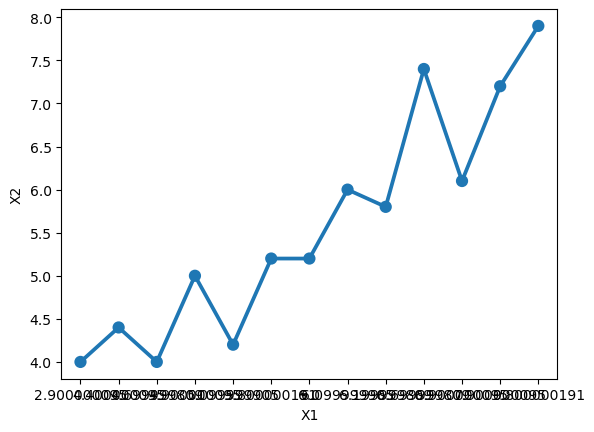

In [242]:
sns.pointplot(data=data1 , x="X1" , y="X2")
plt.show()

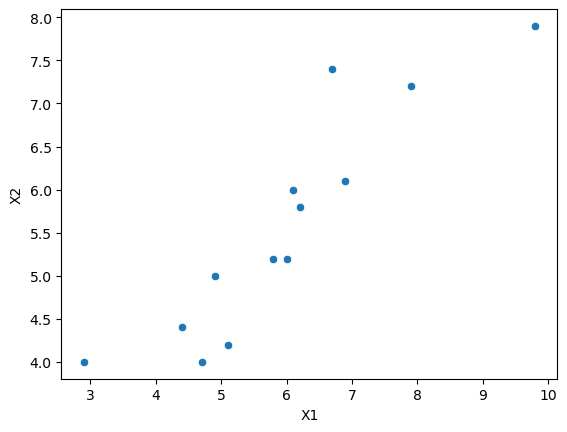

In [243]:
sns.scatterplot(data=data1 , x="X1" , y="X2")
plt.show()

that means the data is linear

#### Define variables X and y. Assign first column data to X and second column to y
<b>Note:</b> X is the independent variable (input to LR model) and y is the dependent variable (output)

In [244]:
x=data[:,0]
y=data[:,1]


#### Explore your data

In [245]:
print("\nthe first column")
print(x)
print("\nthe output")
print(y)


the first column
[2.9000001  6.69999981 4.9000001  7.9000001  9.80000019 6.9000001
 6.0999999  6.19999981 6.         5.0999999  4.69999981 4.4000001
 5.80000019]

the output
[4.         7.4000001  5.         7.19999981 7.9000001  6.0999999
 6.         5.80000019 5.19999981 4.19999981 4.         4.4000001
 5.19999981]


Correlation Matrix:
          X1        X2
X1  1.000000  0.906265
X2  0.906265  1.000000


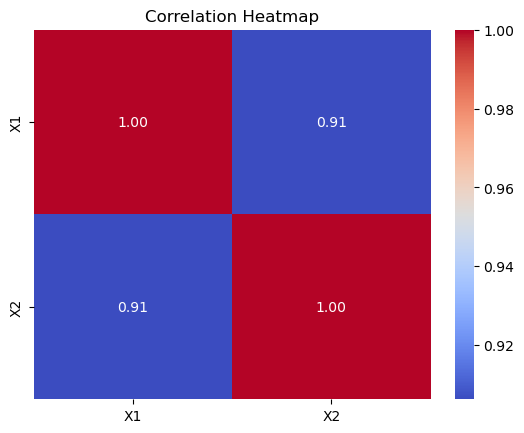

In [246]:
correlation_matrix = data1.corr()

# Print the correlation matrix
print("Correlation Matrix:")
print(correlation_matrix)

# Draw a heatmap
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Heatmap")
plt.show()


## LR Full Implementation

### Step1: Initialize parameters (theta_0 & theta_1) with random value or simply zero. Also choose the Learning rate. 

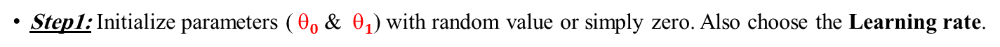

In [247]:
learn_rate=0.001
w1=np.random.uniform(-0.1,0.1)
w2=np.random.uniform(-0.1,0.1)

### Step2: Use (theta_0 & theta_1) to predict the output h(x)= theta_0 + theta_1 * x.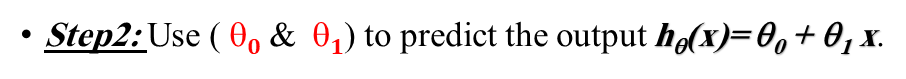
#### Note: you will need to iterate through all data points

In [248]:
def y_pred_calculate(w1,w2,x):
    y_pred= np.zeros(len(x))
    for i in range(len(x)):
        y_pred[i]= w1 + w2 * x[i]
    return y_pred
    


### Step3: Calculate Cost function 𝑱(theta_0,theta_1 ).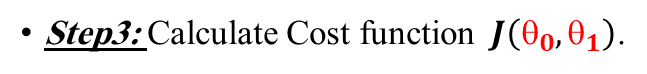
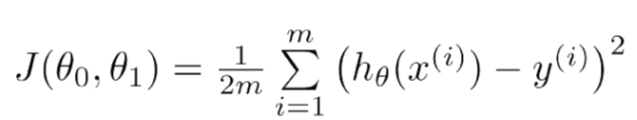

In [249]:
def cost_function(y_pred, y):
    error=0
    for i in range(len(y)):
        error = error +((y_pred[i] - y[i]) ** 2)
    return (1 / (2 * len(y)))*error

### Step4: Calculate the gradient.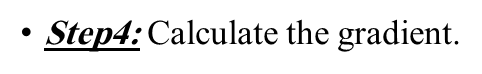
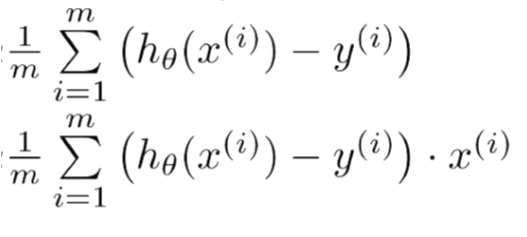

In [250]:
def gradianta(w1, w2, x, y):
    y_pred = y_pred_calculate(w1, w2, x)
    for i in range(len(x)):
        w2=w2+((y_pred[i]-y[i] ) * x[i])
    return (1/len(x))*w2
    
def gradiantb(w1, w2, x, y):
    y_pred = y_pred_calculate(w1, w2, x)
    for i in range(len(x)):
        w1=w1+(y_pred[i]-y[i] )
    return (1/len(x))*w1

### Step5: Update the parameters (simultaneously).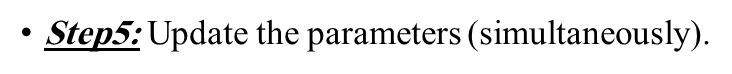
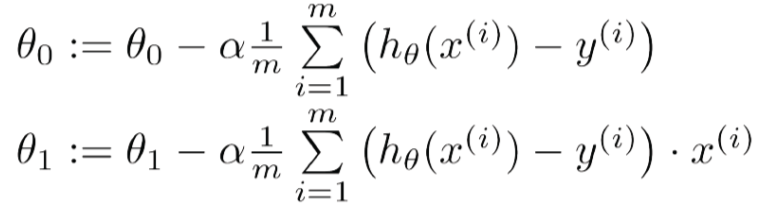

In [251]:
def updatea(w2, learn_rate, x, y, w1):
    return w2 - learn_rate * gradianta(w1, w2, x, y)

def updateb(w1, learn_rate, x, y, w2):
    return w1 - learn_rate * gradiantb(w1, w2, x, y)

### Step6: Repeat from 2 to 5 until converge to the minimum or achieve maximum iterations.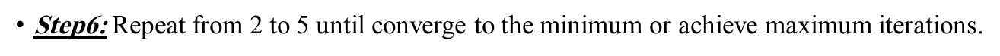

In [252]:
def gradient_descent(x, y, w1, w2,max_iteration,learn_rate,tolerance):
    iteration = 0
    error = float('inf')
    while error > tolerance and max_iteration> iteration:
        y_predicted = y_pred_calculate(w1,w2,x) # calculate the y predicted

        error = cost_function(y_predicted,y) # then take the value of y predicted and calculate the error 

        print(f"Iteration {iteration}, Error: {error}, w1: {w1}, w2: {w2}")

        w1=updateb(w1,learn_rate,x,y,w2) #update using the gradient

        w2=updatea(w2,learn_rate,x,y,w1)
        iteration+=1

    return w1,w2,y_predicted

#### Predict y values using the LR equation
##### h(x)= theta_0 + theta_1 * x

In [253]:
max_iterations = 100000
tolerance = 1e-6
final_w1, final_w2,predicted = gradient_descent(x, y, w1, w2, max_iterations,learn_rate, tolerance)

print(f"Final weights: w1 = {final_w1}, w2 = {final_w2}")

Iteration 0, Error: 13.229784130875098, w1: 0.08931141271059725, w2: 0.0782011020319495
Iteration 1, Error: 12.231683898856843, w1: 0.09431886459786093, w2: 0.1096929779100974
Iteration 2, Error: 11.31009163633565, w1: 0.09913342606032842, w2: 0.1399519392909629
Iteration 3, Error: 10.459139536272312, w1: 0.10376264540939606, w2: 0.16902623632356467
Iteration 4, Error: 9.67340994892843, w1: 0.10821377555354499, w2: 0.1969622308885133
Iteration 5, Error: 8.94790084255601, w1: 0.1124937855589269, w2: 0.2238044704953491
Iteration 6, Error: 8.277993914381252, w1: 0.1166093717575267, w2: 0.2495957592879094
Iteration 7, Error: 7.659425148510946, w1: 0.12056696842060735, w2: 0.27437722627090255
Iteration 8, Error: 7.088257632995971, w1: 0.12437275801444983, w2: 0.2981883908664366
Iteration 9, Error: 6.560856462694893, w1: 0.1280326810547349, w2: 0.32106722590499504
Iteration 10, Error: 6.073865567883519, w1: 0.13155244557527387, w2: 0.3430502181512618
Iteration 11, Error: 5.6241863208384135, 

#### Plot  LR equation output (fitted line) with the original data (scatter plot of X,y)

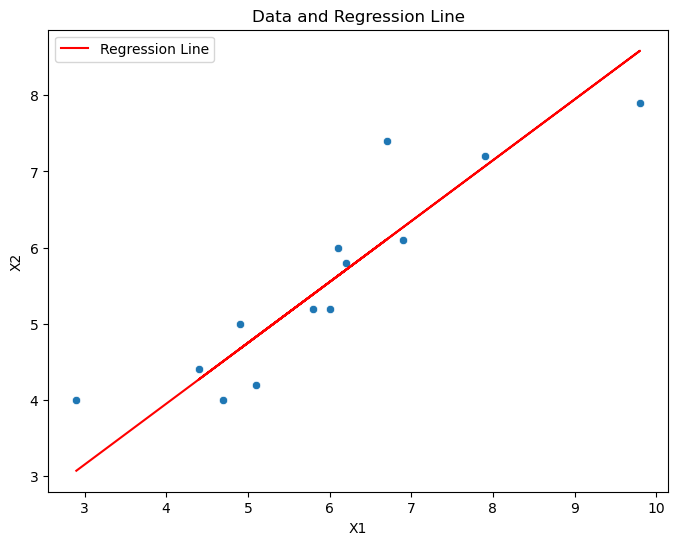

In [254]:
plt.figure(figsize=(8, 6))
y_line = final_w1 + final_w2 * x 
plt.plot(x, y_line, color="red", label="Regression Line")
sns.scatterplot(data=data1 , x= "X1" , y="X2")
plt.xlabel("X1")
plt.ylabel("X2")
plt.title("Data and Regression Line")
plt.legend()
plt.show()


In [255]:
predicted

array([3.07105638, 6.10746379, 4.66916566, 7.06632959, 8.58453349,
       6.26727495, 5.62803108, 5.70793647, 5.5481257 , 4.82897644,
       4.50935451, 4.26963834, 5.38831492])

#### Use R2 score to evaluate LR equation output
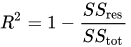
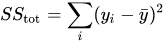
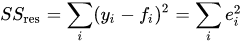
https://en.wikipedia.org/wiki/Coefficient_of_determination

In [256]:
y_=np.mean(y)
SStot=np.sum((y-y_)**2)
SSres=np.sum((predicted - y)**2)
R2= 1-(SSres/SStot)
print(R2)

0.800604391841936


## GD vectorize Implementation
### Implement GD without iterate through data points i.e. use vector operations

In [257]:
def y_pred_calculate2(w1, w2, x):
    return w1 + w2 * np.array(x)

def cost_function2(y_pred, y):
    return (1 / (2 * len(y))) * np.sum((y_pred - y) ** 2)

def gradianta2(w1, w2, x, y):
    y_pred = y_pred_calculate2(w1, w2, x)
    return -np.mean((y - y_pred) * x) # minus from the devriative 

def gradiantb2(w1, w2, x, y):
    y_pred = y_pred_calculate2(w1, w2, x)
    return -np.mean(y - y_pred)

def updatea2(w2, learn_rate, x, y, w1):
    return w2 - learn_rate * gradianta2(w1, w2, x, y)

def updateb2(w1, learn_rate, x, y, w2):
    return w1 - learn_rate * gradiantb2(w1, w2, x, y)

def gradient_descent2(x, y, w1, w2,max_iteration,learn_rate,tolerance):
    iteration = 0
    error = float('inf')
    while error > tolerance and max_iteration> iteration:
        y_predicted = y_pred_calculate2(w1,w2,x) # calculate the y predicted
        error = cost_function2(y_predicted,y) # then take the value of y predicted and calculate the error 
        print(f"Iteration {iteration}, Error: {error}, w1: {w1}, w2: {w2}")
        w1=updateb2(w1,learn_rate,x,y,w2) #update using the gradient
        w2=updatea2(w2,learn_rate,x,y,w2)
        iteration+=1

    return w1,w2,y_predicted

max_iterations = 10000
tolerance = 1e-6
final_w12, final_w22,predicted2 = gradient_descent2(x, y, w1, w2, max_iterations,learn_rate, tolerance)

print(f"Final weights: w1 = {final_w12}, w2 = {final_w22}")


Iteration 0, Error: 13.229784130875098, w1: 0.08931141271059725, w2: 0.0782011020319495
Iteration 1, Error: 12.228561438535479, w1: 0.09432573470653098, w2: 0.10979495605826267
Iteration 2, Error: 11.308775809305974, w1: 0.09914693743396058, w2: 0.139994986451126
Iteration 3, Error: 10.463622423260128, w1: 0.1037835126236438, w2: 0.16886268442080923
Iteration 4, Error: 9.686873605057917, w1: 0.1082435774054014, w2: 0.19645682837457767
Iteration 5, Error: 8.972829476149993, w1: 0.11253489083432991, w2: 0.22283360359721419
Iteration 6, Error: 8.316272844652785, w1: 0.1166648696879286, w2: 0.24804671665160477
Iteration 7, Error: 7.712427968158312, w1: 0.120640603566306, w2: 0.2721475047323222
Iteration 8, Error: 7.156922856173198, w1: 0.12446886932621172, w2: 0.2951850401948661
Iteration 9, Error: 6.645754807601726, w1: 0.1281561448782832, w2: 0.31720623047339447
Iteration 10, Error: 6.175258904931713, w1: 0.13170862237560044, w2: 0.3382559135903924
Iteration 11, Error: 5.742079210763183,

#### Plot the output and calculate R2 score
##### Make sure that you obtained the same results

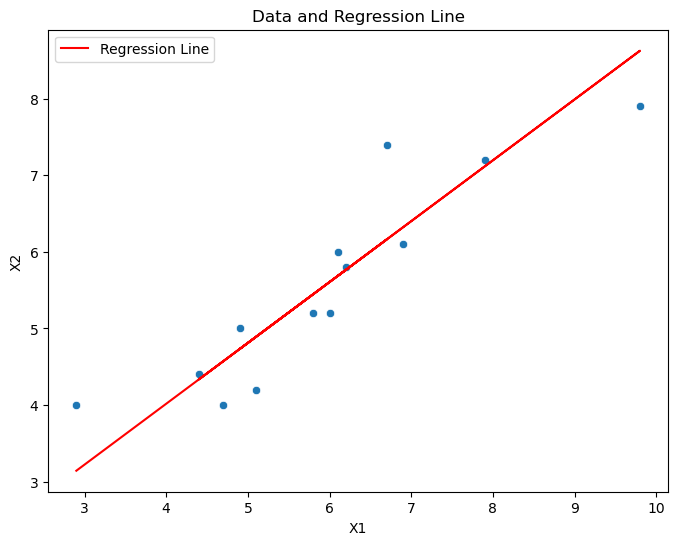

In [258]:
plt.figure(figsize=(8, 6))
y_line2 = final_w12 + final_w22 * x 
plt.plot(x, y_line2, color="red", label="Regression Line")
sns.scatterplot(data=data1 , x= "X1" , y="X2")
plt.xlabel("X1")
plt.ylabel("X2")
plt.title("Data and Regression Line")
plt.legend()
plt.show()

In [259]:
y_=np.mean(y)
SStot=np.sum((y-y_)**2)
SSres=np.sum((predicted2 - y)**2)
R22= 1-(SSres/SStot)
print(R22)

0.8043533261273721


In [260]:
y_=np.mean(y)
SStot=np.sum((y-y_)**2)
SSres=np.sum((predicted - y)**2)
R2= 1-(SSres/SStot)
print(R2)

0.800604391841936


## Plot loss function
### Repeat your last vectorized implementaion version and save loss for each iteration (epoch)

In [261]:
def gradient_descent2(x, y, w1, w2,max_iteration,learn_rate,tolerance):
    iteration = 0
    errorlist = []
    error = float('inf')
    while error > tolerance and max_iteration> iteration:
        y_predicted = y_pred_calculate2(w1,w2,x) # calculate the y predicted
        error = cost_function2(y_predicted,y) # then take the value of y predicted and calculate the error 
        errorlist.append(error)
        print(f"Iteration {iteration}, Error: {error}, w1: {w1}, w2: {w2}")
        w1=updateb2(w1,learn_rate,x,y,w2) #update using the gradient
        w2=updatea2(w2,learn_rate,x,y,w2)
        iteration+=1

    return w1,w2,y_predicted,errorlist

max_iterations = 1000
tolerance = 1e-6
final_w12, final_w22,predicted2,errorlist = gradient_descent2(x, y, w1, w2, max_iterations,learn_rate, tolerance)

print(f"Final weights: w1 = {final_w12}, w2 = {final_w22}")

Iteration 0, Error: 13.229784130875098, w1: 0.08931141271059725, w2: 0.0782011020319495
Iteration 1, Error: 12.228561438535479, w1: 0.09432573470653098, w2: 0.10979495605826267
Iteration 2, Error: 11.308775809305974, w1: 0.09914693743396058, w2: 0.139994986451126
Iteration 3, Error: 10.463622423260128, w1: 0.1037835126236438, w2: 0.16886268442080923
Iteration 4, Error: 9.686873605057917, w1: 0.1082435774054014, w2: 0.19645682837457767
Iteration 5, Error: 8.972829476149993, w1: 0.11253489083432991, w2: 0.22283360359721419
Iteration 6, Error: 8.316272844652785, w1: 0.1166648696879286, w2: 0.24804671665160477
Iteration 7, Error: 7.712427968158312, w1: 0.120640603566306, w2: 0.2721475047323222
Iteration 8, Error: 7.156922856173198, w1: 0.12446886932621172, w2: 0.2951850401948661
Iteration 9, Error: 6.645754807601726, w1: 0.1281561448782832, w2: 0.31720623047339447
Iteration 10, Error: 6.175258904931713, w1: 0.13170862237560044, w2: 0.3382559135903924
Iteration 11, Error: 5.742079210763183,

### Plot loss vs. iterations

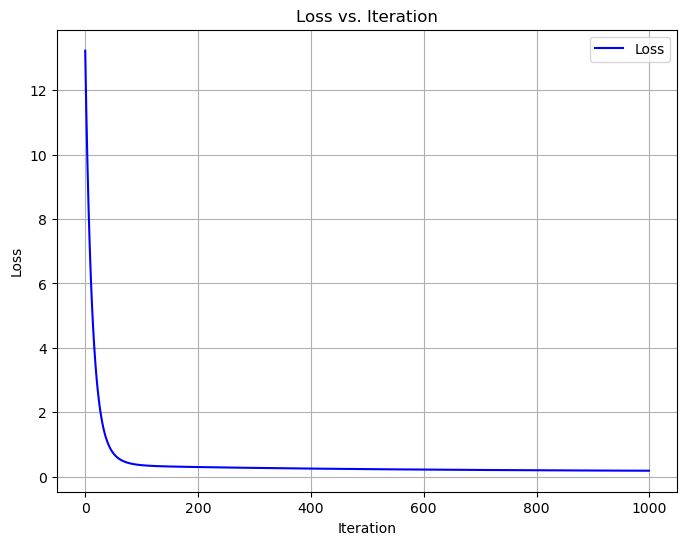

In [262]:
plt.figure(figsize=(8, 6))
plt.plot( errorlist, label="Loss", color="blue")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.title("Loss vs. Iteration")
plt.legend()
plt.grid()
plt.show()

## Multivariate LR

#### Read MultipleLR csv file into numpy array  (check your data)
##### Data source
https://college.cengage.com/mathematics/brase/understandable_statistics/7e/students/datasets/slr/frames/frame.html


'Read the data as a data fram'

In [263]:
data2=pd.read_csv("D:\optimization\data\exam_scores.csv")

In [264]:
data2

,FINAL,EXAM3,EXAM2,EXAM1
0,152.0,75.0,80.0,73.0
1,185.0,93.0,88.0,93.0
2,180.0,90.0,91.0,89.0
3,196.0,100.0,98.0,96.0
4,142.0,70.0,66.0,73.0
5,101.0,55.0,46.0,53.0
6,149.0,77.0,74.0,69.0
7,115.0,60.0,56.0,47.0
8,175.0,90.0,79.0,87.0
9,164.0,88.0,70.0,79.0


Read data as a numpy array

In [265]:
file_path = "D:\optimization\data\exam_scores.csv"

# Load the data into a NumPy array
data4 = np.array(np.genfromtxt(file_path, delimiter=",") )

print("Data as a NumPy array:")
print(data4)


Data as a NumPy array:
[[ nan  nan  nan  nan]
 [152.  75.  80.  73.]
 [185.  93.  88.  93.]
 [180.  90.  91.  89.]
 [196. 100.  98.  96.]
 [142.  70.  66.  73.]
 [101.  55.  46.  53.]
 [149.  77.  74.  69.]
 [115.  60.  56.  47.]
 [175.  90.  79.  87.]
 [164.  88.  70.  79.]
 [141.  73.  70.  69.]
 [141.  74.  65.  70.]
 [184.  91.  95.  93.]
 [152.  73.  80.  79.]
 [148.  78.  73.  70.]
 [192.  96.  89.  93.]
 [147.  68.  75.  78.]
 [183.  93.  90.  81.]
 [177.  86.  92.  88.]
 [159.  77.  83.  78.]
 [177.  90.  86.  82.]
 [175.  89.  82.  86.]
 [175.  85.  83.  78.]
 [149.  71.  83.  76.]
 [192.  95.  93.  96.]]


Show the correlations

Correlation Matrix:
          FINAL     EXAM3     EXAM2     EXAM1
FINAL  1.000000  0.972328  0.929471  0.946071
EXAM3  0.972328  1.000000  0.846359  0.892743
EXAM2  0.929471  0.846359  1.000000  0.901363
EXAM1  0.946071  0.892743  0.901363  1.000000


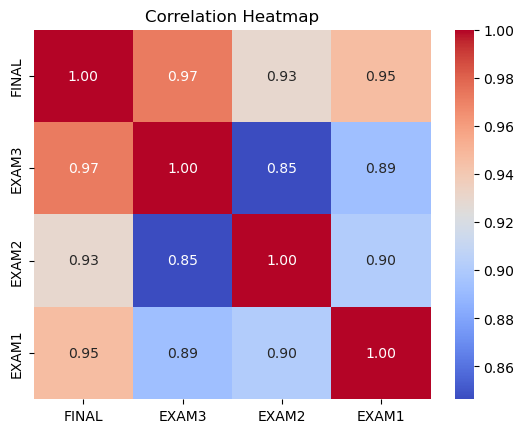

In [266]:
correlation_matrix = data2.corr()

# Print the correlation matrix
print("Correlation Matrix:")
print(correlation_matrix)

# Draw a heatmap
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Heatmap")
plt.show()


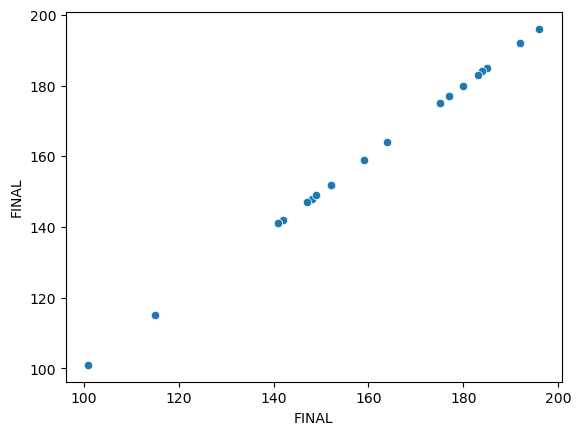

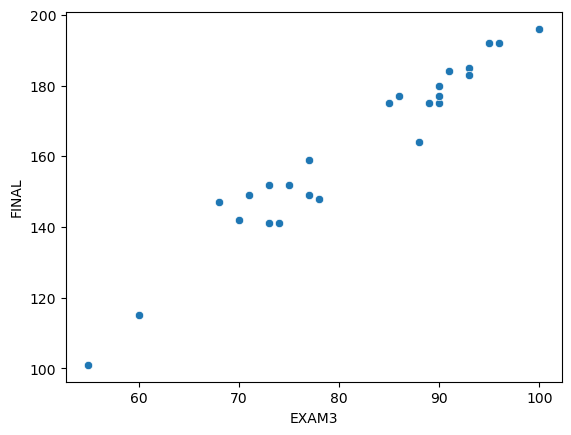

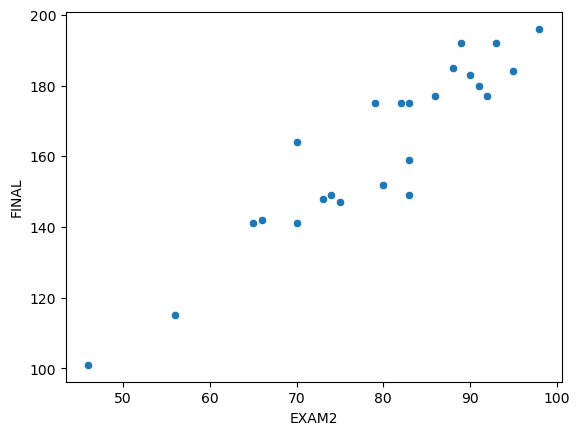

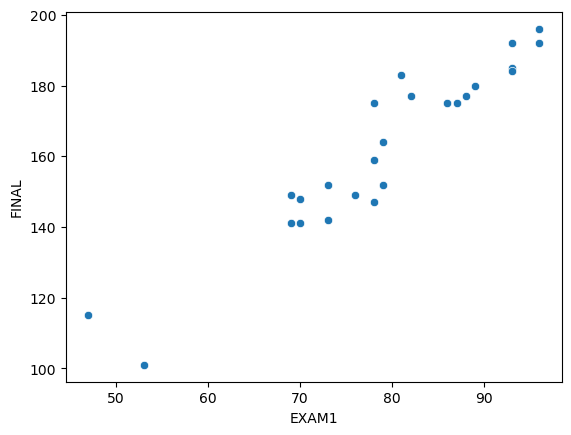

In [267]:
for i in data2.columns :
    sns.scatterplot(data=data2 , x=data2[i], y=data2["FINAL"])
    plt.show()

splet the data

In [268]:
y=data4[1:,0]
x=data4[1:,1:4]

In [269]:
y

array([152., 185., 180., 196., 142., 101., 149., 115., 175., 164., 141.,
       141., 184., 152., 148., 192., 147., 183., 177., 159., 177., 175.,
       175., 149., 192.])

In [270]:
x

array([[ 75.,  80.,  73.],
       [ 93.,  88.,  93.],
       [ 90.,  91.,  89.],
       [100.,  98.,  96.],
       [ 70.,  66.,  73.],
       [ 55.,  46.,  53.],
       [ 77.,  74.,  69.],
       [ 60.,  56.,  47.],
       [ 90.,  79.,  87.],
       [ 88.,  70.,  79.],
       [ 73.,  70.,  69.],
       [ 74.,  65.,  70.],
       [ 91.,  95.,  93.],
       [ 73.,  80.,  79.],
       [ 78.,  73.,  70.],
       [ 96.,  89.,  93.],
       [ 68.,  75.,  78.],
       [ 93.,  90.,  81.],
       [ 86.,  92.,  88.],
       [ 77.,  83.,  78.],
       [ 90.,  86.,  82.],
       [ 89.,  82.,  86.],
       [ 85.,  83.,  78.],
       [ 71.,  83.,  76.],
       [ 95.,  93.,  96.]])

### Repeat your implementation but for more than one variable

In [271]:
def y_pred_calculate(weights, X):
    return np.dot(X, weights)

def cost_function(y_pred, y):
    return (1 / (2 * len(y))) * np.sum((y_pred - y) ** 2)



In [272]:
def gradient(weights, X, y):
    y_pred = y_pred_calculate(weights, X)
    gradients = -(np.dot(X.T, (y - y_pred)) / len(y))
    return gradients


In [273]:
def update(weights, learn_rate, x, y):
    return weights - learn_rate * gradient(weights, x, y)

In [274]:
def gradient_descent(X, y, max_iterations, learn_rate, tolerance,weights):
    error_list = []
    iteration = 0
    error = float('inf')

    while error > tolerance and iteration < max_iterations:
        y_pred = y_pred_calculate(weights, X)
        error = cost_function(y_pred, y)
        error_list.append(error)
        print(f"Iteration {iteration}, Error: {error}, Weights: {weights}")

        weights = update(weights, learn_rate,x,y)
        iteration += 1

    return weights, y_pred, error_list

#### Predict y values using the LR equation
##### h(x)= theta_0 + theta_1 * x1 + theta_2 * x2 + theta_3 * x3

In [275]:
max_iterations = 1000
tolerance = 1e-6
learn_rate = 0.0001
num_features = x.shape[1]
weights = np.random.uniform(-0.1, 0.1, size=num_features)
  
final_weights, predictions, errors = gradient_descent(x, y, max_iterations, learn_rate, tolerance,weights)

print(f"Final Weights: {final_weights}")


Iteration 0, Error: 13772.554775636094, Weights: [-0.03417358  0.06326175 -0.0562514 ]
Iteration 1, Error: 12683.760781857332, Weights: [1.33087511 1.3956938  1.26913432]
Iteration 2, Error: 11681.079135643124, Weights: [ 0.02273247  0.11586504 -0.0034449 ]
Iteration 3, Error: 10757.69916565192, Weights: [1.27988807 1.34286982 1.21708856]
Iteration 4, Error: 9907.348860476004, Weights: [0.07527645 0.16421913 0.04513167]
Iteration 5, Error: 9124.252265714564, Weights: [1.233072   1.29413517 1.16910577]
Iteration 6, Error: 8403.09025053695, Weights: [0.1238028  0.20866053 0.08981301]
Iteration 7, Error: 7738.964377241295, Weights: [1.19009646 1.24916686 1.12486476]
Iteration 8, Error: 7127.3636283906435, Weights: [0.16862869 0.24949916 0.13090734]
Iteration 9, Error: 6564.133765519301, Weights: [1.15065712 1.20766746 1.08406974]
Iteration 10, Error: 6045.449111276836, Weights: [0.21004623 0.28702039 0.16869851]
Iteration 11, Error: 5567.786563338703, Weights: [1.11447372 1.16936304 1.046

### Plot loss vs. iterations

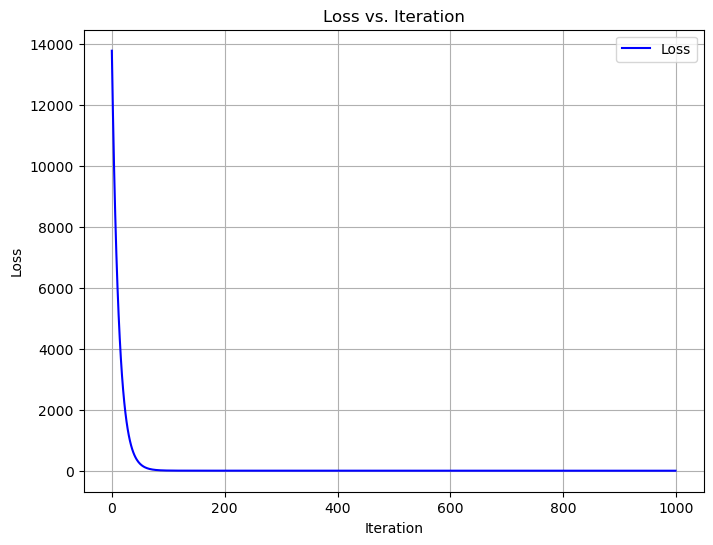

In [276]:
plt.figure(figsize=(8, 6))
plt.plot( errors, label="Loss", color="blue")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.title("Loss vs. Iteration")
plt.legend()
plt.grid()
plt.show()

#### Use R2 score to evaluate LR equation output

In [277]:
y_=np.mean(y)
SStot=np.sum((y-y_)**2)
SSres=np.sum((predictions - y)**2)
R3= 1-(SSres/SStot)
print(R3)

0.9887303617556443


# Bonus
## LR Using sklearn

### Single Variable

#### Build a LR model usin linearmodel.LinearRegression() from sklearn library

In [278]:
X=data[:,0]
Y=data[:,1]

In [279]:
X=X.reshape(-1,1)

In [293]:
model= linear_model.LinearRegression()

#### Train the model (fit the model to the training data)

In [298]:
model.fit(X,Y)

LinearRegression()

#### Predict y values using the trained model

In [299]:
y_test_predect=model.predict(X)

#### Plot model output (fitted line) with the original data (scatter plot of X,y)

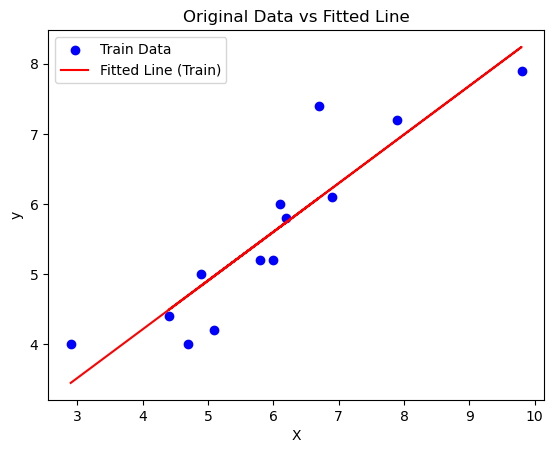

In [300]:
plt.scatter(X, Y, color='blue', label='Train Data')
plt.plot(X, y_test_predect, color='red', label='Fitted Line (Train)')


plt.xlabel('X')
plt.ylabel('y')
plt.title('Original Data vs Fitted Line')
plt.legend()

plt.show()

#### Use R2 score to evaluate model output

In [302]:
r2_score(Y,y_test_predect)

0.8213156778363777

### Repeat for Mulivariate

In [286]:
y=data4[1:,0]
x=data4[1:,1:4]

In [287]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=1234) 

In [288]:
model1= linear_model.LinearRegression()

In [289]:
model1.fit(X_train,y_train)

LinearRegression()

In [290]:
y_test_predect=model1.predict(X_test)

In [291]:
r2_score(y_test,y_test_predect)

0.9845854049349249